# Addressing R3C3 - cluster adata.X vs adata.obsm['X_Z'] vs adata.obsm['X_S_in']
# Beacon data

## Import libraries

In [1]:
import spatialdata as sd
import squidpy as sq

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd

In [3]:
from sklearn.decomposition import PCA

In [4]:
import rapids_singlecell as rsc

In [5]:
import os, sys
from scipy.sparse import issparse
import gc

In [6]:
sc.settings.set_figure_params(frameon=False, figsize=(10, 10))

## Load data

In [7]:
initDir = '/nfs/team361/ls34/inflow/'
saveDir = '/nfs/team361/ms83/data/skin/xenium_mintflow/analysis/'

In [8]:
adata = sc.read_h5ad(initDir + 'adata_10ad_spatial.h5ad')

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/anndata/_core/anndata.py:1796: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [9]:
adata

AnnData object with n_obs × n_vars = 197487 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5', 'NICHE_NAMES', 'spatial_niche', 'key_celltype_new'
    uns: 'NICHE_NAMES_colors', 'de_leiden', 'inflow_biological_batch_ID_colors', 'inflow_cell_type_colors',

In [10]:
adata.obs

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,...,n_genes,inflow_cell_type,inflow_biological_batch_ID,inflow_slice_ID,inflow_signaling_activity,leiden_res0.8,leiden_res0.5,NICHE_NAMES,spatial_niche,key_celltype_new
combined_index,,,,,,,,,,,,,,,,,,,,,
aaaebhjc-1_BK23_Lesional Baseline,aaaebhjc-1,16.819510,3740.512695,701,0,0,0,0,2,701.000000,...,493,KC1-2,BK23_Lesional Baseline,BK23_Lesional Baseline,0.646689,0,2,Epidermis basal,Epidermis_mid,KC1-2
aaaeoajc-1_BK23_Lesional Baseline,aaaeoajc-1,19.395952,3793.578857,295,0,0,0,0,2,295.000000,...,257,Melanocyte,BK23_Lesional Baseline,BK23_Lesional Baseline,0.715805,10,10,Epidermis basal,Epidermis_basal,Melanocyte
aaagclgd-1_BK23_Lesional Baseline,aaagclgd-1,10.301003,3787.306152,428,0,0,0,0,1,428.000000,...,329,KC1-2,BK23_Lesional Baseline,BK23_Lesional Baseline,0.701296,0,2,Epidermis basal,Epidermis_mid,KC1-2
aaagpmeb-1_BK23_Lesional Baseline,aaagpmeb-1,13.544814,3746.257568,772,0,0,0,0,0,772.000000,...,531,KC1-2,BK23_Lesional Baseline,BK23_Lesional Baseline,0.696395,1,6,Epidermis basal,Epidermis_mid,KC1-2
aaakcdpa-1_BK23_Lesional Baseline,aaakcdpa-1,28.582693,3805.690918,624,0,0,0,0,0,624.000000,...,427,KC1-2,BK23_Lesional Baseline,BK23_Lesional Baseline,0.649175,0,2,Epidermis basal,Epidermis_mid,KC1-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oimeihoe-1_BK18_Lesional Baseline,oimeihoe-1,1847.042969,47.649593,84,0,0,0,0,0,87.581131,...,76,Mast cell,BK18_Lesional Baseline,BK18_Lesional Baseline,0.645661,7,9,Interstial stroma2,T_DC,Mast cell
oimjlcgb-1_BK18_Lesional Baseline,oimjlcgb-1,1961.155518,1540.710327,209,0,0,0,0,0,106.932404,...,161,F2: Universal,BK18_Lesional Baseline,BK18_Lesional Baseline,0.622380,3,8,Interstial stroma1,Stroma,Fibroblast
oinmkkeo-1_BK18_Lesional Baseline,oinmkkeo-1,1836.577759,1413.305786,165,0,0,0,0,1,108.632553,...,143,F2: Universal,BK18_Lesional Baseline,BK18_Lesional Baseline,0.739130,3,8,Interstial stroma1,Stroma,Fibroblast


In [11]:
#adata_spl = sc.read_h5ad(initDir + 'final_adatas/adata_eczema_spatial_prepped.h5ad')
#adata_spl

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/anndata/_core/anndata.py:1796: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 197487 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5', 'NICHE_NAMES', 'spatial_niche', 'key_celltype_new'
    uns: 'NICHE_NAMES_colors', 'de_leiden', 'inflow_biological_batch_ID_colors', 'inflow_cell_type_colors',

In [34]:
#adata_int = sc.read_h5ad(initDir + 'final_adatas/adata_10ad_intrinsic.h5ad')
#adata_int

/software/cellgen/team361/ms83/envs/env_Dec11th_mintflowandrapids/lib/python3.11/site-packages/anndata/_core/anndata.py:1796: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 197487 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5'
    uns: 'inflow_biological_batch_ID_colors', 'inflow_cell_type_colors', 'leiden_res0.5', 'leiden_res0.5_colors', 'leiden_res0.8', 'leiden_res0.8_colors', 'nei

## Check adata.X

In [11]:
adata_X = sc.read_h5ad(saveDir + 'adata_10ad_spatial_leiden05_Xemb.h5ad')

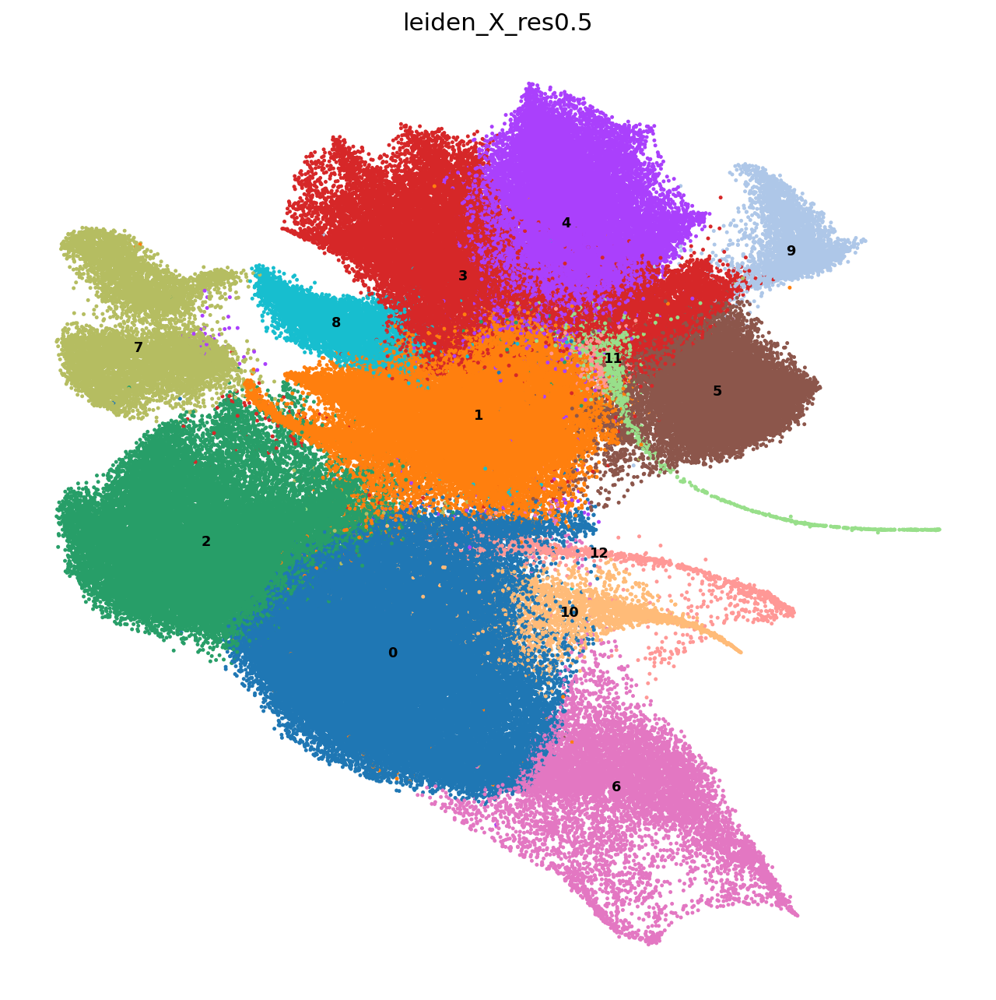

In [12]:
sc.pl.umap(adata_X,  
           color=['leiden_X_res0.5',],
           s=20,
           legend_loc="on data",
           legend_fontsize=8
          )

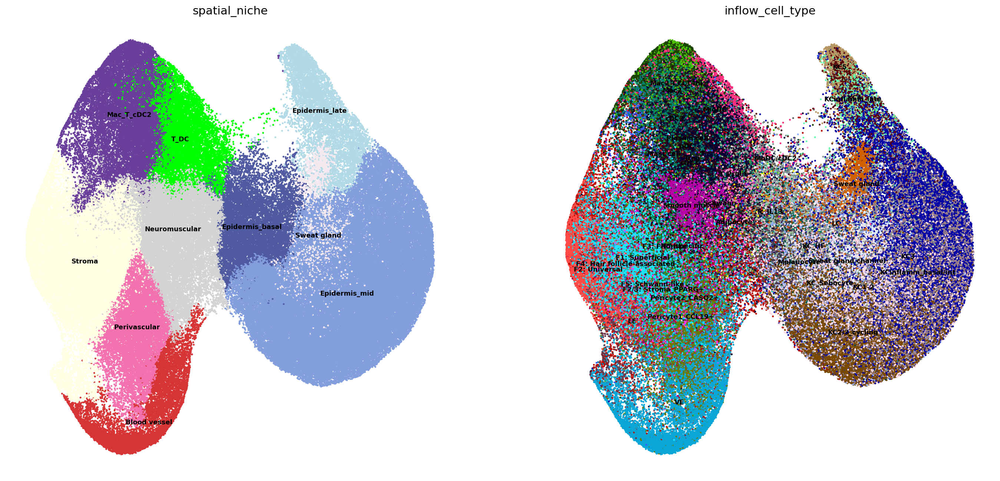

In [14]:
sc.pl.umap(adata,  
           color=['spatial_niche', 'inflow_cell_type'],
           s=20,
           legend_loc="on data",
           legend_fontsize=8)

## Check adata.obsm['X_Z']

In [15]:
pca = PCA(n_components=50, svd_solver="arpack")
X_pca_barint = pca.fit_transform(adata.obsm["inflow_Z"])

adata.obsm["X_PCA_Z"] = X_pca_barint
adata.uns["X_PCA_Z"] = {
    'variance': pca.explained_variance_,
    'variance_ratio': pca.explained_variance_ratio_
}

rsc.pp.neighbors(adata, use_rep="X_PCA_Z", key_added="neighbors_Z")
rsc.tl.umap(adata, neighbors_key="neighbors_Z", key_added="X_UMAP_Z")

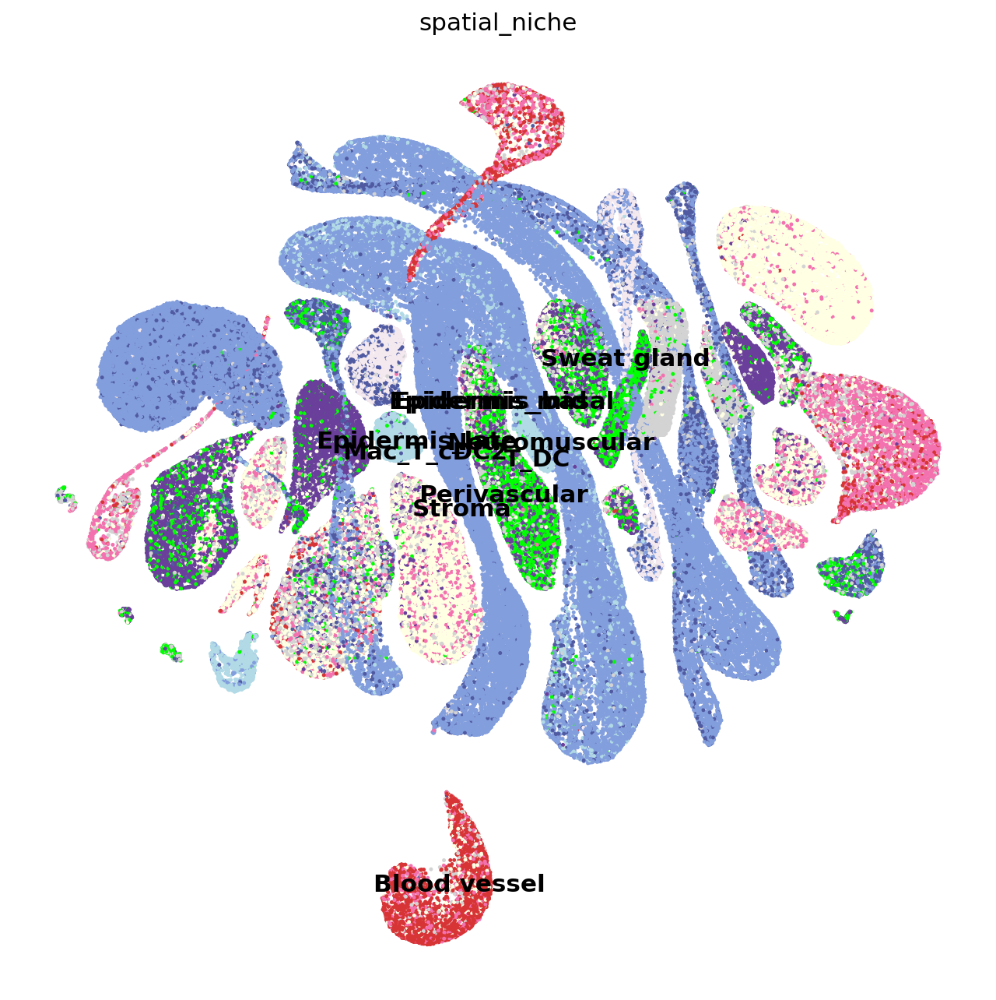

In [16]:
sc.pl.embedding(
    adata,
    color='spatial_niche',
    basis="X_UMAP_Z",
    s=20,
    frameon=False,
    legend_loc = 'on data'
)

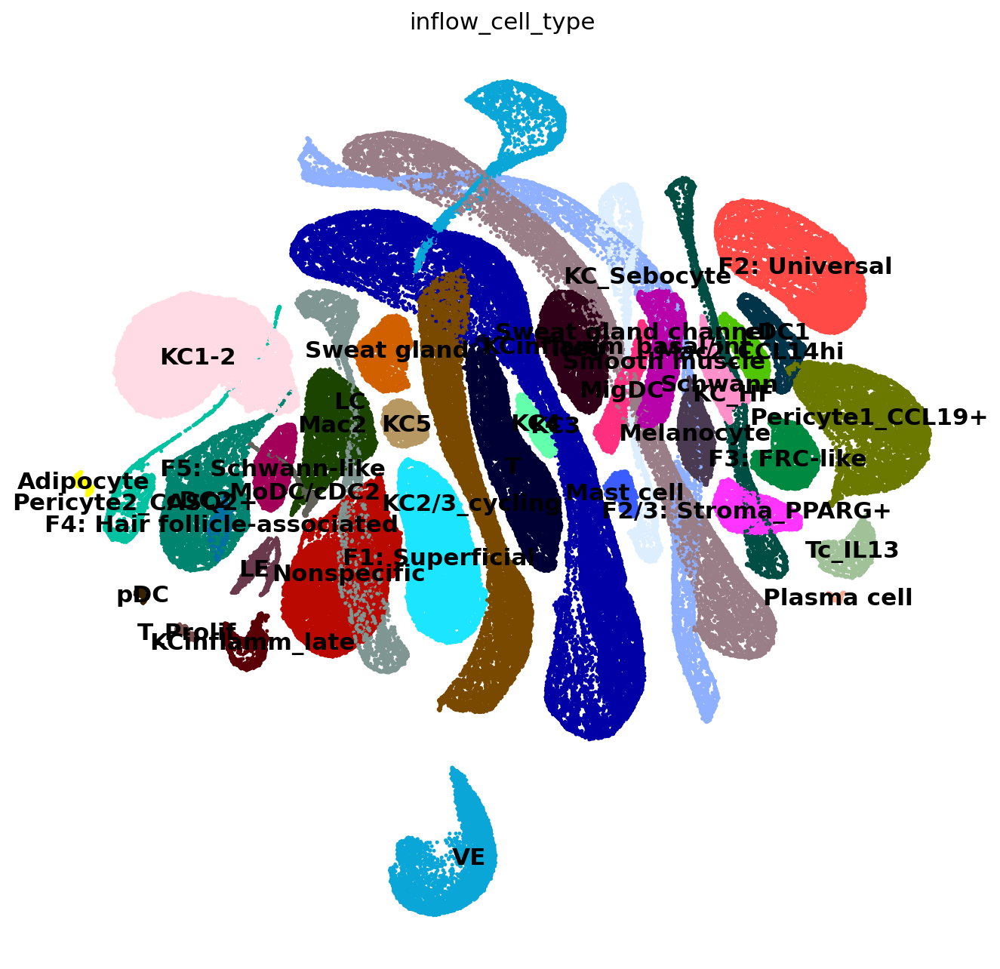

In [18]:
sc.pl.embedding(
    adata,
    color='inflow_cell_type',
    basis="X_UMAP_Z",
    frameon=False,
    s=20,
    legend_loc = 'on data'
)

In [26]:
sc.tl.leiden(adata, 
             flavor="igraph", 
             n_iterations=2,
             resolution=0.5,
             neighbors_key="neighbors_Z", 
             key_added="leiden_Z_0.5"
            )

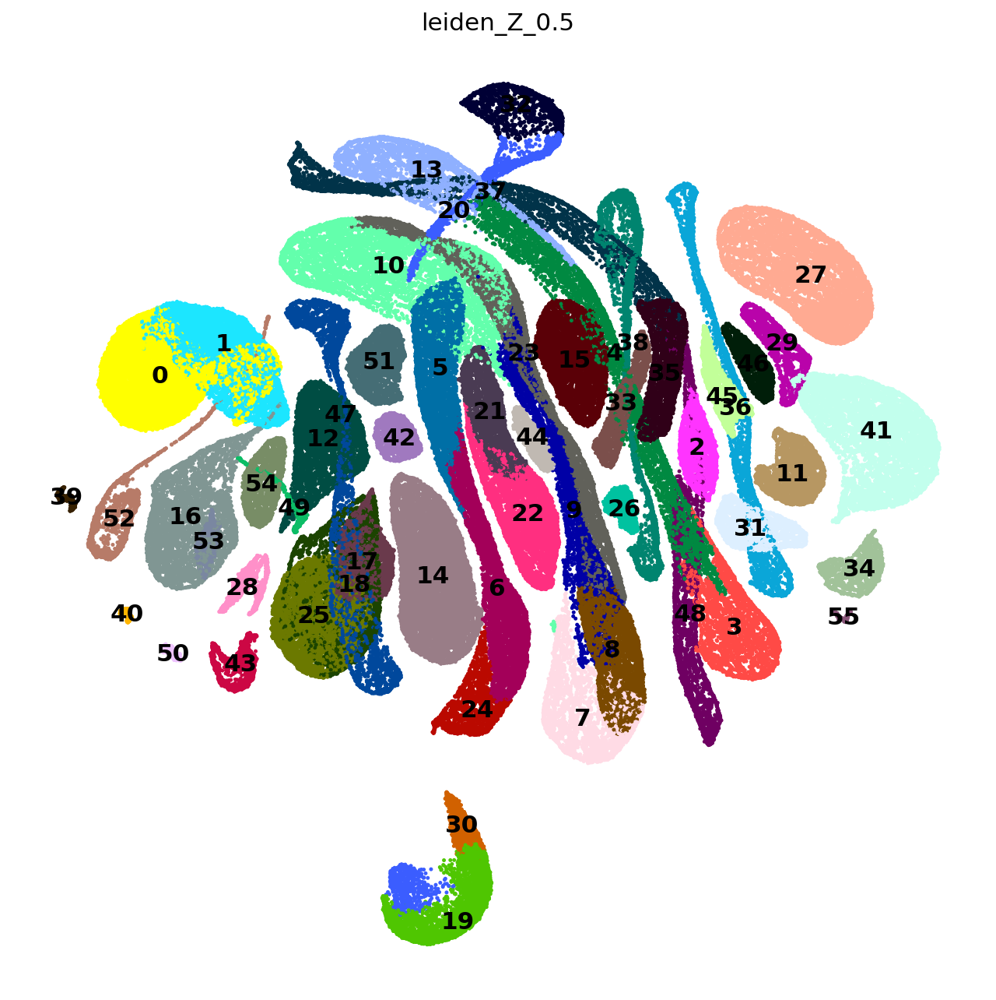

In [27]:
sc.pl.embedding(
    adata,
    color='leiden_Z_0.5',
    basis="X_UMAP_Z",
    frameon=False,
    s=20,
    legend_loc = 'on data'
)

## Check adata.obsm['X_S_in']

In [21]:
pca = PCA(n_components=50, svd_solver="arpack")
X_pca_barint = pca.fit_transform(adata.obsm["inflow_S_in"])

adata.obsm["X_PCA_S_in"] = X_pca_barint
adata.uns["X_PCA_S_in"] = {
    'variance': pca.explained_variance_,
    'variance_ratio': pca.explained_variance_ratio_
}

rsc.pp.neighbors(adata, use_rep="X_PCA_S_in", key_added="neighbors_S_in")
rsc.tl.umap(adata, neighbors_key="neighbors_S_in", key_added="X_UMAP_S_in")

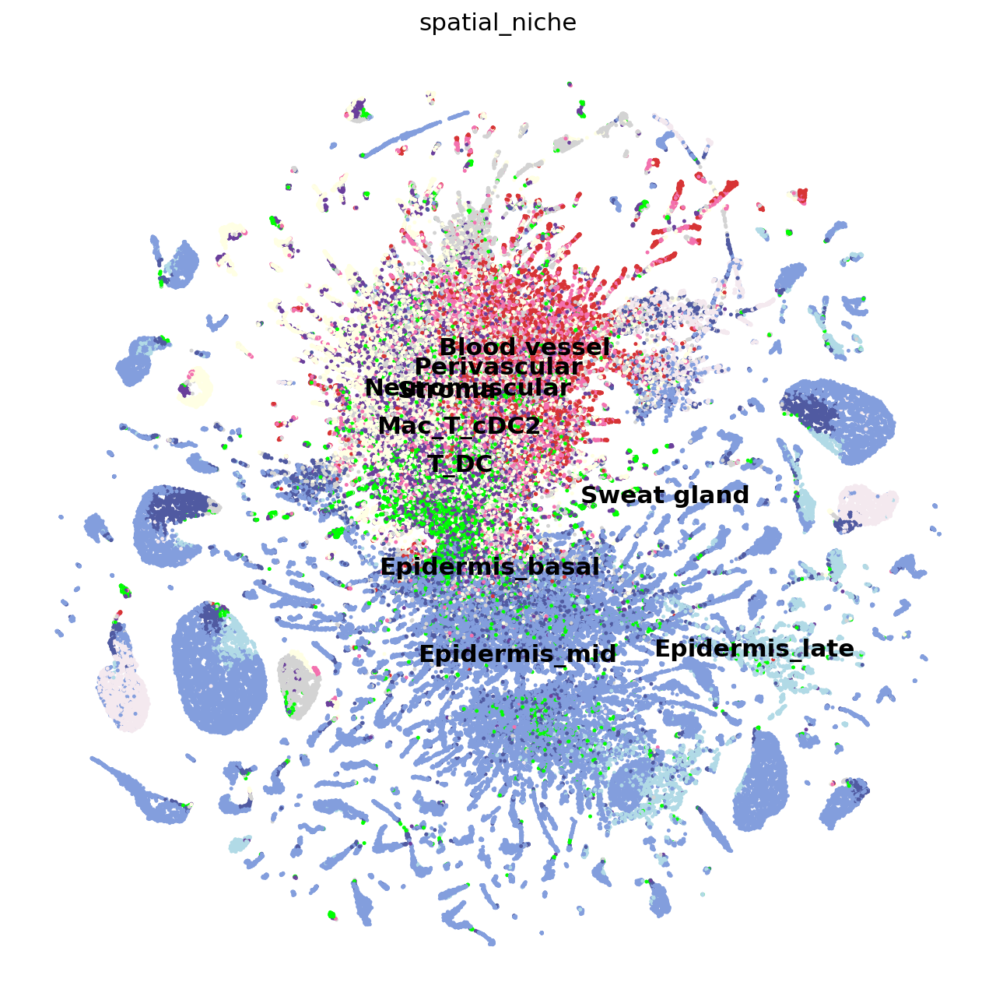

In [22]:
sc.pl.embedding(
    adata,
    color='spatial_niche',
    basis="X_UMAP_S_in",
    s=20,
    frameon=False,
    legend_loc = 'on data'
)

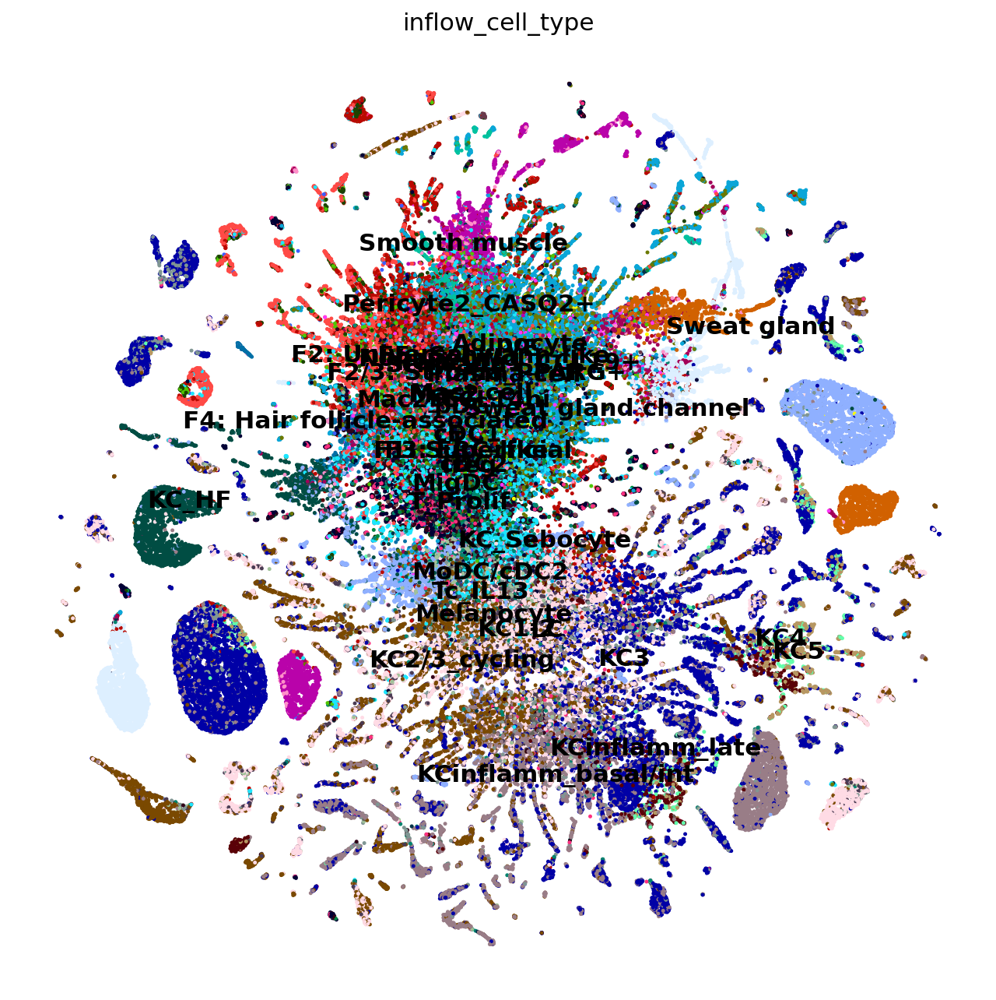

In [28]:
sc.pl.embedding(
    adata,
    color='inflow_cell_type',
    basis="X_UMAP_S_in",
    s=20,
    frameon=False,
    legend_loc = 'on data'
)

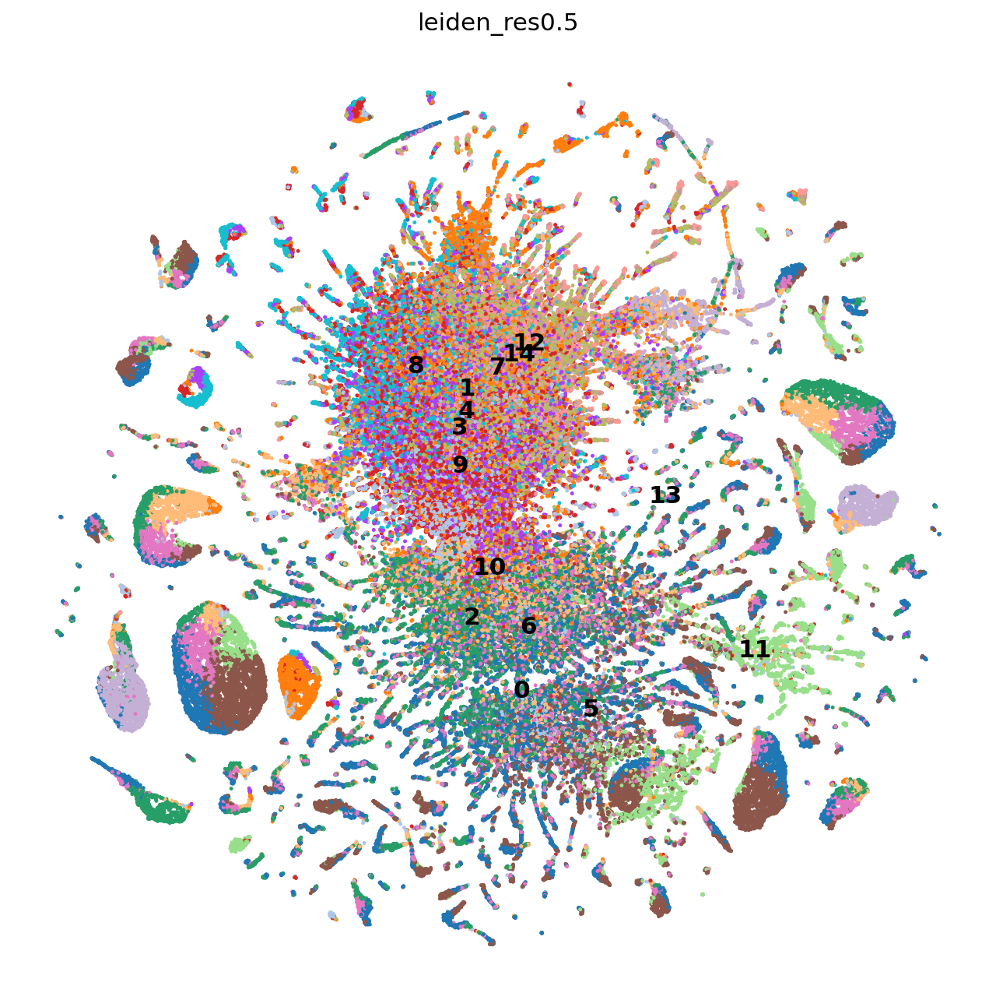

In [23]:
sc.pl.embedding(
    adata,
    color='leiden_res0.5',
    basis="X_UMAP_S_in",
    s=20,
    frameon=False,
    legend_loc = 'on data'
)

## Sankey plot

In [36]:
adata.shape

(197487, 1032)

In [37]:
adata_X.shape

(197483, 1032)

In [38]:
adata = adata[~adata.obs_names.duplicated(keep="first")].copy()

In [39]:
# Left: MintFlow spatial niches
adata.obs["mintflow_spatial_niche"] = adata.obs["spatial_niche"].astype(str)

# Middle: intrinsic clusters
adata.obs["leiden_intrinsic_res0.5"] = adata.obs["leiden_Z_0.5"].astype(str)

# Right: raw expression clusters
adata_X.obs["leiden_expression_res0.5"] = adata_X.obs["leiden_X_res0.5"].astype(str)

In [40]:
COLORS = {
    'Mac_T_cDC2': '#6A3F9B',
    'Neuromuscular': '#D3D3D3',
    'T_rich': "#dcb0f2",
    'Blood vessel': '#d73435',
    'T_DC': '#00FF00',
    'Appendage': "#e28743",
    'Sweat gland': '#f4e9ef',
    'Epidermis_late': '#b1dae6',
    'Perivascular': '#f371af',
    'Stroma': '#FFFFE4',
    'Epidermis_mid': '#839edd',
    'Epidermis_basal': '#505aa1'
}
colors = COLORS


In [41]:
COLORS = {
    'Mac_T_cDC2': '#6A3F9B',
    'Neuromuscular': '#D3D3D3',
    'T_rich': "#dcb0f2",
    'Blood vessel': '#d73435',
    'T_DC': '#00FF00',
    'Appendage': "#e28743",
    'Sweat gland': '#f4e9ef',
    'Epidermis_late': '#b1dae6',
    'Perivascular': '#f371af',
    'Stroma': '#FFFFE4',
    'Epidermis_mid': '#839edd',
    'Epidermis_basal': '#505aa1'
}
colors = COLORS

def alluvial_3col(
    adata_left,
    adata_mid,
    adata_right,
    left_col: str,
    mid_col: str,
    right_col: str,
    min_cells: int = 50,
    figsize=(18, 10),
    title="Alluvial: spatial niche → intrinsic clusters → expression clusters",
    cmap_name="Set3",
    left_x=0.08,
    mid_x=0.50,
    right_x=0.92,
    bar_w=0.06,
    pad=0.01,
    height_scale=0.90,
    flow_alpha=0.13,
    mid_bar_alpha=0.55,
    right_bar_alpha=0.55,
    seed=0,
):
    """
    Matplotlib alluvial plot for three categorical partitions across (left, mid, right).
    Colors are assigned by LEFT categories and propagated through flows and bars.

    adata_left/adata_mid/adata_right can be the same object or different; cells are aligned by obs_names.
    """
    rng = np.random.default_rng(seed)

    # ---------- Align cells ----------
    common = adata_left.obs_names.intersection(adata_mid.obs_names).intersection(adata_right.obs_names)
    if len(common) == 0:
        raise ValueError("No overlapping obs_names between the provided AnnData objects.")

    L = adata_left.obs.loc[common, left_col].astype(str)
    M = adata_mid.obs.loc[common, mid_col].astype(str)
    R = adata_right.obs.loc[common, right_col].astype(str)

    df = pd.DataFrame({"left": L.values, "mid": M.values, "right": R.values}, index=common)

    # ---------- Build pairwise counts ----------
    df_LM = df.groupby(["left", "mid"]).size().reset_index(name="count")
    df_MR = df.groupby(["mid", "right"]).size().reset_index(name="count")

    # ---------- Optional filtering based on LM and MR edges ----------
    df_LM = df_LM[df_LM["count"] >= min_cells].copy()
    # Keep only mid categories that survive LM filter (otherwise middle bars disappear)
    mids_kept = set(df_LM["mid"].unique())
    df_MR = df_MR[df_MR["mid"].isin(mids_kept)].copy()
    df_MR = df_MR[df_MR["count"] >= min_cells].copy()

    # Recompute kept sets after filtering
    lefts = df_LM.groupby("left")["count"].sum().sort_values(ascending=False)
    mids = df_LM.groupby("mid")["count"].sum().sort_values(ascending=False)
    rights = df_MR.groupby("right")["count"].sum().sort_values(ascending=False)

    # Total mass for scaling: use total cells represented in flows.
    # Conservative choice: total LM flow (after filtering).
    total = df_LM["count"].sum()
    if total == 0:
        raise ValueError("After filtering, there are no edges to plot. Lower min_cells.")

    # ---------- Colors keyed on LEFT categories ----------
    color_map = color_map = {cat: colors.get(cat, "#CCCCCC") for cat in lefts.index}

    fig, ax = plt.subplots(figsize=figsize)

    # ---------- Helper: draw stacked bars and record y-centers ----------
    def draw_column(categories_counts, x_left, label_align, alpha=1.0, color_fn=None, fontsize=9, weight="bold"):
        """
        Draws vertical stack as horizontal bars at fixed x position.
        Returns dict: category -> y_center, and dict: category -> (y0, y1) for slotting.
        """
        y = 0.0
        centers = {}
        spans = {}
        for cat, count in categories_counts.items():
            h = (count / total) * height_scale
            y0, y1 = y, y + h
            c = color_fn(cat) if color_fn else "lightgray"
            ax.barh(y + h / 2, bar_w, h, left=x_left, color=c, edgecolor="white", linewidth=2, alpha=alpha)
            if label_align == "right":
                ax.text(x_left - 0.01, y + h / 2, f"{cat}\n{int(count):,}", ha="right", va="center",
                        fontsize=fontsize, weight=weight)
            elif label_align == "left":
                ax.text(x_left + bar_w + 0.01, y + h / 2, f"{cat}\n{int(count):,}", ha="left", va="center",
                        fontsize=fontsize, weight=weight)
            else:  # center
                ax.text(x_left + bar_w / 2, y + h / 2, f"{cat}\n{int(count):,}", ha="center", va="center",
                        fontsize=fontsize, weight=weight)
            centers[cat] = y + h / 2
            spans[cat] = (y0, y1)
            y = y1 + pad
        return centers, spans

    # Left bars colored by left category
    left_centers, left_spans = draw_column(
        lefts, x_left=left_x, label_align="right", alpha=1.0,
        color_fn=lambda c: color_map[c], fontsize=9, weight="bold"
    )

    # Middle bars: assign a representative left color = most contributing left to that mid (from LM)
    mid2left = (
        df_LM.sort_values("count", ascending=False)
        .drop_duplicates("mid")
        .set_index("mid")["left"]
        .to_dict()
    )
    mid_centers, mid_spans = draw_column(
        mids, x_left=mid_x, label_align="center", alpha=mid_bar_alpha,
        color_fn=lambda m: color_map.get(mid2left.get(m, list(color_map.keys())[0]), "lightgray"),
        fontsize=9, weight="bold"
    )

    # Right bars: color by dominant left via MR composed with mid2left (or just gray if unknown)
    right2mid = (
        df_MR.sort_values("count", ascending=False)
        .drop_duplicates("right")
        .set_index("right")["mid"]
        .to_dict()
    )
    right_centers, right_spans = draw_column(
        rights, x_left=right_x, label_align="left", alpha=right_bar_alpha,
        color_fn=lambda r: color_map.get(mid2left.get(right2mid.get(r, ""), ""), "lightgray"),
        fontsize=8, weight="normal"
    )

    # ---------- Flow drawer ----------
    def draw_flow(x0, x1, y0, y1, h, color):
        x = np.linspace(x0, x1, 120)
        # cosine interpolation (same as your style)
        t = (x - x0) / (x1 - x0)
        y_curve = y0 + (y1 - y0) * (1 - np.cos(np.pi * t)) / 2
        ax.fill_between(x, y_curve - h / 2, y_curve + h / 2, color=color, alpha=flow_alpha, linewidth=0)

    # ---------- Slot flows so they don't all overlap at the same y ----------
    # We allocate sub-intervals within each bar span for each outgoing/incoming edge.
    def allocate_slots(df_edges, src_name, dst_name, src_spans, dst_spans):
        """
        For each source category, stack outgoing edges from top to bottom within the source span.
        Similarly, for each destination, stack incoming edges.
        Returns df_edges with src_y and dst_y midpoints and edge height h.
        """
        df_edges = df_edges.copy()

        # Precompute totals per node to scale within its span
        src_tot = df_edges.groupby(src_name)["count"].sum().to_dict()
        dst_tot = df_edges.groupby(dst_name)["count"].sum().to_dict()

        # Track current offset within each span
        src_offset = {k: src_spans[k][0] for k in src_tot.keys()}
        dst_offset = {k: dst_spans[k][0] for k in dst_tot.keys()}

        src_y = []
        dst_y = []
        heights = []

        for _, row in df_edges.iterrows():
            s = row[src_name]
            d = row[dst_name]
            c = row["count"]

            # Height in plot coordinates
            h = (c / total) * height_scale
            heights.append(h)

            # Allocate within source span
            y0_s = src_offset[s]
            y1_s = y0_s + h
            src_offset[s] = y1_s
            src_y.append((y0_s + y1_s) / 2)

            # Allocate within dest span
            y0_d = dst_offset[d]
            y1_d = y0_d + h
            dst_offset[d] = y1_d
            dst_y.append((y0_d + y1_d) / 2)

        df_edges["src_y"] = src_y
        df_edges["dst_y"] = dst_y
        df_edges["h"] = heights
        return df_edges

    # Left -> Mid flows (colored by left)
    df_LM_slots = allocate_slots(df_LM, "left", "mid", left_spans, mid_spans)
    for _, row in df_LM_slots.iterrows():
        draw_flow(
            x0=left_x + bar_w, x1=mid_x,
            y0=row["src_y"], y1=row["dst_y"],
            h=row["h"],
            color=color_map[row["left"]],
        )

    # Mid -> Right flows (color by the left "origin" of the mid category)
    # To propagate consistent colors, assign each mid->right edge the color of the dominant-left for that mid.
    df_MR_slots = allocate_slots(df_MR, "mid", "right", mid_spans, right_spans)
    for _, row in df_MR_slots.iterrows():
        col_left = mid2left.get(row["mid"], None)
        col = color_map[col_left] if col_left in color_map else "lightgray"
        draw_flow(
            x0=mid_x + bar_w, x1=right_x,
            y0=row["src_y"], y1=row["dst_y"],
            h=row["h"],
            color=col,
        )

    # ---------- Final cosmetics ----------
    ax.set_xlim(0, 1.05)
    ymax = max(
    max(v[1] for v in left_spans.values()),
    max(v[1] for v in mid_spans.values()),
    max(v[1] for v in right_spans.values()),
    )
    ax.set_ylim(-0.02, ymax + 0.02)
    ax.axis("off")
    ax.set_title(title, fontsize=16, weight="bold", pad=20)

    # Column labels
    label_y = -0.06 * ymax  # relative offset below the lowest bar

    ax.text(
        left_x + bar_w / 2,
        label_y,
        "MintFlow spatial niche",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )
    
    ax.text(
        mid_x + bar_w / 2,
        label_y,
        "Intrinsic clusters\n(Leiden res = 0.5)",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )
    
    ax.text(
        right_x + bar_w / 2,
        label_y,
        "Expression clusters\n(Leiden res = 0.5)",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )

    plt.tight_layout()
    plt.show()

    return {
        "df_LM": df_LM,
        "df_MR": df_MR,
        "left_totals": lefts,
        "mid_totals": mids,
        "right_totals": rights
    }

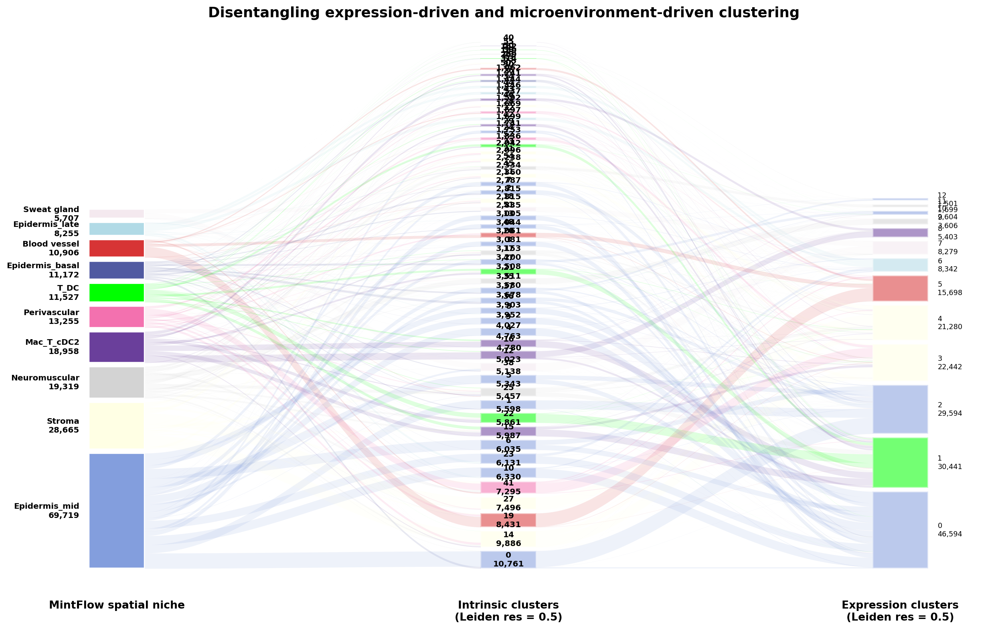

In [42]:
out = alluvial_3col(
    adata_left=adata,
    adata_mid=adata,
    adata_right=adata_X,
    left_col="mintflow_spatial_niche",
    mid_col="leiden_intrinsic_res0.5",
    right_col="leiden_expression_res0.5",
    min_cells=0,
    figsize=(16, 10),
    title="Disentangling expression-driven and microenvironment-driven clustering"
)

In [44]:
COLORS = {
    'Mac_T_cDC2': '#6A3F9B',
    'Neuromuscular': '#D3D3D3',
    'T_rich': "#dcb0f2",
    'Blood vessel': '#d73435',
    'T_DC': '#00FF00',
    'Appendage': "#e28743",
    'Sweat gland': '#f4e9ef',
    'Epidermis_late': '#b1dae6',
    'Perivascular': '#f371af',
    'Stroma': '#FFFFE4',
    'Epidermis_mid': '#839edd',
    'Epidermis_basal': '#505aa1'
}
colors = COLORS

def alluvial_3col(
    adata_left,
    adata_mid,
    adata_right,
    left_col: str,
    mid_col: str,
    right_col: str,
    min_cells: int = 50,
    figsize=(18, 10),
    title="Alluvial: spatial niche → intrinsic clusters → expression clusters",
    cmap_name="Set3",
    left_x=0.08,
    mid_x=0.50,
    right_x=0.92,
    bar_w=0.06,
    pad=0.01,
    height_scale=0.90,
    flow_alpha=0.13,
    mid_bar_alpha=0.55,
    right_bar_alpha=0.55,
    seed=0,
):
    """
    Matplotlib alluvial plot for three categorical partitions across (left, mid, right).
    Colors are assigned by LEFT categories and propagated through flows and bars.

    adata_left/adata_mid/adata_right can be the same object or different; cells are aligned by obs_names.
    """
    rng = np.random.default_rng(seed)

    # ---------- Align cells ----------
    common = adata_left.obs_names.intersection(adata_mid.obs_names).intersection(adata_right.obs_names)
    if len(common) == 0:
        raise ValueError("No overlapping obs_names between the provided AnnData objects.")

    L = adata_left.obs.loc[common, left_col].astype(str)
    M = adata_mid.obs.loc[common, mid_col].astype(str)
    R = adata_right.obs.loc[common, right_col].astype(str)

    df = pd.DataFrame({"left": L.values, "mid": M.values, "right": R.values}, index=common)

    # ---------- Build pairwise counts ----------
    df_LM = df.groupby(["left", "mid"]).size().reset_index(name="count")
    df_MR = df.groupby(["mid", "right"]).size().reset_index(name="count")

    # ---------- Optional filtering based on LM and MR edges ----------
    df_LM = df_LM[df_LM["count"] >= min_cells].copy()
    # Keep only mid categories that survive LM filter (otherwise middle bars disappear)
    mids_kept = set(df_LM["mid"].unique())
    df_MR = df_MR[df_MR["mid"].isin(mids_kept)].copy()
    df_MR = df_MR[df_MR["count"] >= min_cells].copy()

    # Recompute kept sets after filtering
    lefts = df_LM.groupby("left")["count"].sum().sort_values(ascending=False)
    mids = df_LM.groupby("mid")["count"].sum().sort_values(ascending=False)
    rights = df_MR.groupby("right")["count"].sum().sort_values(ascending=False)

    # Total mass for scaling: use total cells represented in flows.
    # Conservative choice: total LM flow (after filtering).
    total = df_LM["count"].sum()
    if total == 0:
        raise ValueError("After filtering, there are no edges to plot. Lower min_cells.")

    # ---------- Colors keyed on LEFT categories ----------
    color_map = color_map = {cat: colors.get(cat, "#CCCCCC") for cat in lefts.index}

    fig, ax = plt.subplots(figsize=figsize)

    # ---------- Helper: draw stacked bars and record y-centers ----------
    def draw_column(categories_counts, x_left, label_align, alpha=1.0, color_fn=None, fontsize=9, weight="bold"):
        """
        Draws vertical stack as horizontal bars at fixed x position.
        Returns dict: category -> y_center, and dict: category -> (y0, y1) for slotting.
        """
        y = 0.0
        centers = {}
        spans = {}
        for cat, count in categories_counts.items():
            h = (count / total) * height_scale
            y0, y1 = y, y + h
            c = color_fn(cat) if color_fn else "lightgray"
            ax.barh(y + h / 2, bar_w, h, left=x_left, color=c, edgecolor="white", linewidth=2, alpha=alpha)
            if label_align == "right":
                ax.text(x_left - 0.01, y + h / 2, f"{cat}\n{int(count):,}", ha="right", va="center",
                        fontsize=fontsize, weight=weight)
            elif label_align == "left":
                ax.text(x_left + bar_w + 0.01, y + h / 2, f"{cat}\n{int(count):,}", ha="left", va="center",
                        fontsize=fontsize, weight=weight)
            else:  # center
                ax.text(x_left + bar_w / 2, y + h / 2, f"{cat}\n{int(count):,}", ha="center", va="center",
                        fontsize=fontsize, weight=weight)
            centers[cat] = y + h / 2
            spans[cat] = (y0, y1)
            y = y1 + pad
        return centers, spans

    # Left bars colored by left category
    left_centers, left_spans = draw_column(
        lefts, x_left=left_x, label_align="right", alpha=1.0,
        color_fn=lambda c: color_map[c], fontsize=9, weight="bold"
    )

    # Middle bars: assign a representative left color = most contributing left to that mid (from LM)
    mid2left = (
        df_LM.sort_values("count", ascending=False)
        .drop_duplicates("mid")
        .set_index("mid")["left"]
        .to_dict()
    )
    mid_centers, mid_spans = draw_column(
        mids, x_left=mid_x, label_align="center", alpha=mid_bar_alpha,
        color_fn=lambda m: color_map.get(mid2left.get(m, list(color_map.keys())[0]), "lightgray"),
        fontsize=9, weight="bold"
    )

    # Right bars: color by dominant left via MR composed with mid2left (or just gray if unknown)
    right2mid = (
        df_MR.sort_values("count", ascending=False)
        .drop_duplicates("right")
        .set_index("right")["mid"]
        .to_dict()
    )
    right_centers, right_spans = draw_column(
        rights, x_left=right_x, label_align="left", alpha=right_bar_alpha,
        color_fn=lambda r: color_map.get(mid2left.get(right2mid.get(r, ""), ""), "lightgray"),
        fontsize=8, weight="normal"
    )

    # ---------- Flow drawer ----------
    def draw_flow(x0, x1, y0, y1, h, color):
        x = np.linspace(x0, x1, 120)
        # cosine interpolation (same as your style)
        t = (x - x0) / (x1 - x0)
        y_curve = y0 + (y1 - y0) * (1 - np.cos(np.pi * t)) / 2
        ax.fill_between(x, y_curve - h / 2, y_curve + h / 2, color=color, alpha=flow_alpha, linewidth=0)

    # ---------- Slot flows so they don't all overlap at the same y ----------
    # We allocate sub-intervals within each bar span for each outgoing/incoming edge.
    def allocate_slots(df_edges, src_name, dst_name, src_spans, dst_spans):
        """
        For each source category, stack outgoing edges from top to bottom within the source span.
        Similarly, for each destination, stack incoming edges.
        Returns df_edges with src_y and dst_y midpoints and edge height h.
        """
        df_edges = df_edges.copy()

        # Precompute totals per node to scale within its span
        src_tot = df_edges.groupby(src_name)["count"].sum().to_dict()
        dst_tot = df_edges.groupby(dst_name)["count"].sum().to_dict()

        # Track current offset within each span
        src_offset = {k: src_spans[k][0] for k in src_tot.keys()}
        dst_offset = {k: dst_spans[k][0] for k in dst_tot.keys()}

        src_y = []
        dst_y = []
        heights = []

        for _, row in df_edges.iterrows():
            s = row[src_name]
            d = row[dst_name]
            c = row["count"]

            # Height in plot coordinates
            h = (c / total) * height_scale
            heights.append(h)

            # Allocate within source span
            y0_s = src_offset[s]
            y1_s = y0_s + h
            src_offset[s] = y1_s
            src_y.append((y0_s + y1_s) / 2)

            # Allocate within dest span
            y0_d = dst_offset[d]
            y1_d = y0_d + h
            dst_offset[d] = y1_d
            dst_y.append((y0_d + y1_d) / 2)

        df_edges["src_y"] = src_y
        df_edges["dst_y"] = dst_y
        df_edges["h"] = heights
        return df_edges

    # Left -> Mid flows (colored by left)
    df_LM_slots = allocate_slots(df_LM, "left", "mid", left_spans, mid_spans)
    for _, row in df_LM_slots.iterrows():
        draw_flow(
            x0=left_x + bar_w, x1=mid_x,
            y0=row["src_y"], y1=row["dst_y"],
            h=row["h"],
            color=color_map[row["left"]],
        )

    # Mid -> Right flows (color by the left "origin" of the mid category)
    # To propagate consistent colors, assign each mid->right edge the color of the dominant-left for that mid.
    df_MR_slots = allocate_slots(df_MR, "mid", "right", mid_spans, right_spans)
    for _, row in df_MR_slots.iterrows():
        col_left = mid2left.get(row["mid"], None)
        col = color_map[col_left] if col_left in color_map else "lightgray"
        draw_flow(
            x0=mid_x + bar_w, x1=right_x,
            y0=row["src_y"], y1=row["dst_y"],
            h=row["h"],
            color=col,
        )

    # ---------- Final cosmetics ----------
    ax.set_xlim(0, 1.05)
    ymax = max(
    max(v[1] for v in left_spans.values()),
    max(v[1] for v in mid_spans.values()),
    max(v[1] for v in right_spans.values()),
    )
    ax.set_ylim(-0.02, ymax + 0.02)
    ax.axis("off")
    ax.set_title(title, fontsize=16, weight="bold", pad=20)

    # Column labels
    label_y = -0.06 * ymax  # relative offset below the lowest bar

    ax.text(
        left_x + bar_w / 2,
        label_y,
        "MintFlow spatial niche",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )
    
    ax.text(
        mid_x + bar_w / 2,
        label_y,
        "Expression clusters\n(Leiden res = 0.5)",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )
    
    ax.text(
        right_x + bar_w / 2,
        label_y,
        "Intrinsic clusters\n(Leiden res = 0.5)",
        ha="center",
        va="top",
        fontsize=12,
        weight="bold",
    )

    plt.tight_layout()
    plt.show()

    return {
        "df_LM": df_LM,
        "df_MR": df_MR,
        "left_totals": lefts,
        "mid_totals": mids,
        "right_totals": rights
    }

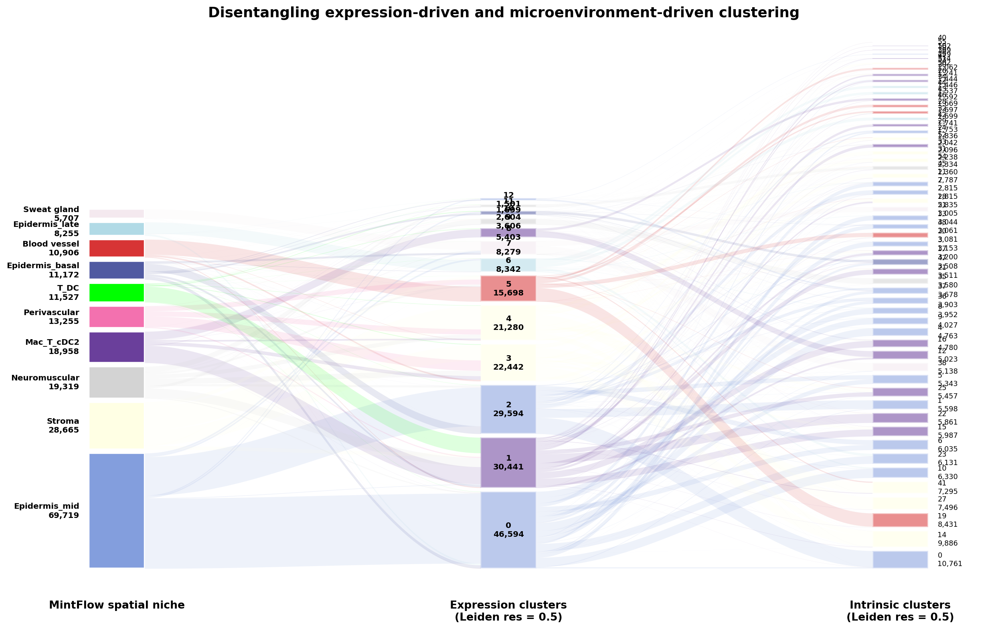

In [45]:
out = alluvial_3col(
    adata_left=adata,
    adata_mid=adata_X,
    adata_right=adata,
    left_col="mintflow_spatial_niche",
    mid_col="leiden_expression_res0.5",
    right_col="leiden_intrinsic_res0.5",
    min_cells=0,
    figsize=(16, 10),
    title="Disentangling expression-driven and microenvironment-driven clustering"
)

In [46]:
adata_X

AnnData object with n_obs × n_vars = 197483 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5', 'NICHE_NAMES', 'spatial_niche', 'key_celltype_new', 'leiden_X_res0.8', 'leiden_X_res0.5', 'mintflow_spatial_niche', 'leiden_expression_res0.5'
    uns: 'NICHE

In [47]:
adata

AnnData object with n_obs × n_vars = 197483 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5', 'NICHE_NAMES', 'spatial_niche', 'key_celltype_new', 'leiden_Z_0.5', 'mintflow_spatial_niche', 'leiden_intrinsic_res0.5'
    uns: 'NICHE_NAMES_colors', 'de_lei

In [48]:
adata.write_h5ad(saveDir + 'adata_10ad_spatial_V2.h5ad')

... storing 'mintflow_spatial_niche' as categorical
... storing 'leiden_intrinsic_res0.5' as categorical


In [49]:
adata_X.write_h5ad(saveDir + 'adata_10ad_spatial_leiden05_Xemb_V2.h5ad')

... storing 'leiden_expression_res0.5' as categorical


In [50]:
adata_X

AnnData object with n_obs × n_vars = 197483 × 1032
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample_id', 'Sanger patient ID', 'Drug', 'Responder', 'Timepoint', 'Site_status', 'info_id', 'sample', 'niche_name', 'lvl1', 'lvl0', 'veryfine_celltypes_new5', 'veryfine_celltypes_new5_incprolif', 'veryfine_celltypes', 'fine_celltypes_new', 'mod_celltypes_new', 'broad_celltypes_new', 'Site_status_binary', 'fine_celltypes', 'broad_celltypes', 'n_counts', 'n_genes', 'inflow_cell_type', 'inflow_biological_batch_ID', 'inflow_slice_ID', 'inflow_signaling_activity', 'leiden_res0.8', 'leiden_res0.5', 'NICHE_NAMES', 'spatial_niche', 'key_celltype_new', 'leiden_X_res0.8', 'leiden_X_res0.5', 'mintflow_spatial_niche', 'leiden_expression_res0.5'
    uns: 'NICHE

In [51]:
for k in ["pca", "neighbors"]:
    if k in adata_X.uns:
        # remove only the nested params if present
        if isinstance(adata_X.uns[k], dict) and "params" in adata_X.uns[k]:
            # sometimes 'mask_var' lives under params
            adata_X.uns[k]["params"].pop("mask_var", None)

# Save with compression; this will re-encode with your working anndata version
adata_X.write_h5ad(saveDir + "adata_10ad_spatial_leiden05_Xemb_V2_for_nichecompass.h5ad", compression="gzip")